# Customer Segmentation

In this part of the project, you will find

- Data Preprocessing & Feature Engineering \
- RFM Analysis
- Customer Segmentation

## 1. Reading the dataset

In [1]:
from datetime import datetime, timedelta,date
import pandas as pd
%matplotlib inline
from sklearn.metrics import classification_report,confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from __future__ import division
from sklearn.cluster import KMeans

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import plotly.offline as pyoff
import plotly.graph_objs as go

In [4]:
import chart_studio.plotly as py

In [5]:
pyoff.init_notebook_mode()

In [6]:
csv_file = "data/SU_ORNEKLEM_KK_HAR_BILGI.txt"
trans = pd.read_csv(csv_file,sep=',',encoding='latin-1')

In [7]:
trans.head()

,MUSTERI_ID_MASK,ISLEM_TARIHI,ISLEM_SAAT,ISLEM_TUTARI,MCC,UYEISYERI_ID_MASK,ONLINE_ISLEM,HARCAMA_TIPI,DOVIZ_FMT,X,Y
0,11861396,23OCT2014:00:00:00,21:01:13,10.57,RESTORAN,999999,0,AV,TURK_LIRASI,NaN,NaN
1,13667756,12APR2015:00:00:00,15:18:50,82.00,RESTORAN,999999,0,AV,TURK_LIRASI,NaN,NaN
2,11024865,23JUL2014:00:00:00,21:12:12,15.00,RESTORAN,999999,0,AV,TURK_LIRASI,NaN,NaN
3,10922788,06AUG2014:00:00:00,21:54:49,86.00,RESTORAN,999999,0,AV,TURK_LIRASI,NaN,NaN
4,10335987,12APR2015:00:00:00,19:10:09,30.00,RESTORAN,999999,0,AV,TURK_LIRASI,NaN,NaN


In [8]:
#Transforming the Date column
trans['ISLEM_TARIHI'] = pd.to_datetime(trans['ISLEM_TARIHI'], format="%d%b%Y:%H:%M:%S")
trans['Date'] = [d.date() for d in trans['ISLEM_TARIHI']]
trans.head()

,MUSTERI_ID_MASK,ISLEM_TARIHI,ISLEM_SAAT,ISLEM_TUTARI,MCC,UYEISYERI_ID_MASK,ONLINE_ISLEM,HARCAMA_TIPI,DOVIZ_FMT,X,Y,Date
0,11861396,2014-10-23,21:01:13,10.57,RESTORAN,999999,0,AV,TURK_LIRASI,NaN,NaN,2014-10-23
1,13667756,2015-04-12,15:18:50,82.00,RESTORAN,999999,0,AV,TURK_LIRASI,NaN,NaN,2015-04-12
2,11024865,2014-07-23,21:12:12,15.00,RESTORAN,999999,0,AV,TURK_LIRASI,NaN,NaN,2014-07-23
3,10922788,2014-08-06,21:54:49,86.00,RESTORAN,999999,0,AV,TURK_LIRASI,NaN,NaN,2014-08-06
4,10335987,2015-04-12,19:10:09,30.00,RESTORAN,999999,0,AV,TURK_LIRASI,NaN,NaN,2015-04-12


In [9]:
#Date is character
trans['Date'].describe()

count        9334625
unique           365
top       2014-10-03
freq           35567
Name: Date, dtype: object

In [10]:
trans['Date'] = pd.to_datetime(trans['Date'])

In [11]:
#Date
trans['Date'].describe()

count                 9334625
unique                    365
top       2014-10-03 00:00:00
freq                    35567
first     2014-07-01 00:00:00
last      2015-06-30 00:00:00
Name: Date, dtype: object

In [12]:
#the first 6 months of the data
trans_6m = trans[(trans.Date < "2015-01-01") & (trans.Date >= "2014-07-01")].reset_index(drop=True)

In [13]:
#Make sure to taking the first 6 months
trans_6m['Date'].describe()

count                 4544438
unique                    184
top       2014-10-03 00:00:00
freq                    35567
first     2014-07-01 00:00:00
last      2014-12-31 00:00:00
Name: Date, dtype: object

In [14]:
#Second 6 months of data
trans_next = trans[(trans.Date >= "2015-01-01") & (trans.Date < "2015-07-01")].reset_index(drop=True)

In [15]:
#Make sure to taking the last 6 months
trans_next['Date'].describe()

count                 4790187
unique                    181
top       2015-05-09 00:00:00
freq                    34482
first     2015-01-01 00:00:00
last      2015-06-30 00:00:00
Name: Date, dtype: object

# 2. Feature Engineering

In [16]:
#Creating a new dataframe: trans_user with unique Customer_ID
trans_user = pd.DataFrame(trans_6m['MUSTERI_ID_MASK'].unique())
trans_user.columns = ['MUSTERI_ID_MASK']
trans_user.head()

,MUSTERI_ID_MASK
0,11861396
1,11024865
2,10922788
3,3859074
4,11099890


In [17]:
# Creating a new data frame "trans_next_first_purchase"
# Finding the first transaction date of the second 6 months data
trans_next_first_purchase = trans_next.groupby('MUSTERI_ID_MASK').Date.min().reset_index()
trans_next_first_purchase.head()

,MUSTERI_ID_MASK,Date
0,1560993,2015-04-08
1,1566513,2015-01-20
2,1567711,2015-01-07
3,1569761,2015-03-01
4,1569938,2015-01-10


In [18]:
#Renaming the columns
trans_next_first_purchase.columns = ['MUSTERI_ID_MASK','MinPurchaseDate']

In [19]:
trans_next_first_purchase.head()

,MUSTERI_ID_MASK,MinPurchaseDate
0,1560993,2015-04-08
1,1566513,2015-01-20
2,1567711,2015-01-07
3,1569761,2015-03-01
4,1569938,2015-01-10


In [20]:
# Creating a new data frame "trans_last_purchase"
# Finding the last transaction date of the first 6 months data
trans_last_purchase = trans_6m.groupby('MUSTERI_ID_MASK').Date.max().reset_index()
trans_last_purchase.head()

,MUSTERI_ID_MASK,Date
0,1566513,2014-09-16
1,1567711,2014-12-28
2,1569761,2014-12-31
3,1569938,2014-12-27
4,1572737,2014-12-31


In [21]:
#Renaming the columns
trans_last_purchase.columns = ['MUSTERI_ID_MASK','MaxPurchaseDate']

In [22]:
trans_last_purchase.head()

,MUSTERI_ID_MASK,MaxPurchaseDate
0,1566513,2014-09-16
1,1567711,2014-12-28
2,1569761,2014-12-31
3,1569938,2014-12-27
4,1572737,2014-12-31


In [23]:
#Creating a new dataframe "trans_purchase_dates"
#Merging two dataframes "trans_next_first_purchase" and "trans_last_purchase" on Customer ID
trans_purchase_dates = pd.merge(trans_last_purchase,trans_next_first_purchase,on='MUSTERI_ID_MASK',how='left')

In [24]:
trans_purchase_dates.head()

,MUSTERI_ID_MASK,MaxPurchaseDate,MinPurchaseDate
0,1566513,2014-09-16,2015-01-20
1,1567711,2014-12-28,2015-01-07
2,1569761,2014-12-31,2015-03-01
3,1569938,2014-12-27,2015-01-10
4,1572737,2014-12-31,2015-01-01


In [25]:
#Calculating the next purchase day
trans_purchase_dates['NextPurchaseDay'] = (trans_purchase_dates['MinPurchaseDate'] - trans_purchase_dates['MaxPurchaseDate']).dt.days

In [26]:
trans_purchase_dates.head()

,MUSTERI_ID_MASK,MaxPurchaseDate,MinPurchaseDate,NextPurchaseDay
0,1566513,2014-09-16,2015-01-20,126.0
1,1567711,2014-12-28,2015-01-07,10.0
2,1569761,2014-12-31,2015-03-01,60.0
3,1569938,2014-12-27,2015-01-10,14.0
4,1572737,2014-12-31,2015-01-01,1.0


In [27]:
trans_user = pd.merge(trans_user, trans_purchase_dates[['MUSTERI_ID_MASK','NextPurchaseDay']],on='MUSTERI_ID_MASK',how='left')

In [28]:
trans_user.head()

,MUSTERI_ID_MASK,NextPurchaseDay
0,11861396,168.0
1,11024865,1.0
2,10922788,1.0
3,3859074,1.0
4,11099890,11.0


In [29]:
trans_user.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88544 entries, 0 to 88543
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   MUSTERI_ID_MASK  88544 non-null  int64  
 1   NextPurchaseDay  78556 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 2.0 MB


In [30]:
#filled na s with 999
trans_user = trans_user.fillna(999)

In [31]:
trans_user.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88544 entries, 0 to 88543
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   MUSTERI_ID_MASK  88544 non-null  int64  
 1   NextPurchaseDay  88544 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 2.0 MB


# 3. RFM Analysis

## 3.1 Recency

In [32]:
# Creating a new data frame "trans_max_purchase"
# Finding the last transaction date of the first 6 months data
trans_max_purchase = trans_6m.groupby('MUSTERI_ID_MASK').Date.max().reset_index()
#trans_last_purchase = trans_6m.groupby('MUSTERI_ID_MASK').Date.max().reset_index()

In [33]:
#Reming the columns
trans_max_purchase.columns = ['MUSTERI_ID_MASK','MaxPurchaseDate']

In [34]:
trans_max_purchase.head()

,MUSTERI_ID_MASK,MaxPurchaseDate
0,1566513,2014-09-16
1,1567711,2014-12-28
2,1569761,2014-12-31
3,1569938,2014-12-27
4,1572737,2014-12-31


In [35]:
#Finding the latest date of the transaction inn the first 6 months of data
trans_max_purchase['MaxPurchaseDate'].max()

Timestamp('2014-12-31 00:00:00')

In [36]:
#Finding the recency
trans_max_purchase['Recency'] = (trans_max_purchase['MaxPurchaseDate'].max() - trans_max_purchase['MaxPurchaseDate']).dt.days

In [37]:
trans_max_purchase.head()

,MUSTERI_ID_MASK,MaxPurchaseDate,Recency
0,1566513,2014-09-16,106
1,1567711,2014-12-28,3
2,1569761,2014-12-31,0
3,1569938,2014-12-27,4
4,1572737,2014-12-31,0


In [38]:
#Adding recency to the trans_user
trans_user = pd.merge(trans_user, trans_max_purchase[['MUSTERI_ID_MASK','Recency']], on='MUSTERI_ID_MASK')

In [39]:
trans_user.head()

,MUSTERI_ID_MASK,NextPurchaseDay,Recency
0,11861396,168.0,3
1,11024865,1.0,0
2,10922788,1.0,0
3,3859074,1.0,0
4,11099890,11.0,1


In [40]:
# Scale the recency column
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
trans_user[["Recency_scaled"]] = scaler.fit_transform(trans_user[["Recency"]])

#[["Recency_scaled"]]= new col name
#["Recency"] = col you want to scale

In [41]:
trans_user.head()

,MUSTERI_ID_MASK,NextPurchaseDay,Recency,Recency_scaled
0,11861396,168.0,3,0.016393
1,11024865,1.0,0,0.000000
2,10922788,1.0,0,0.000000
3,3859074,1.0,0,0.000000
4,11099890,11.0,1,0.005464


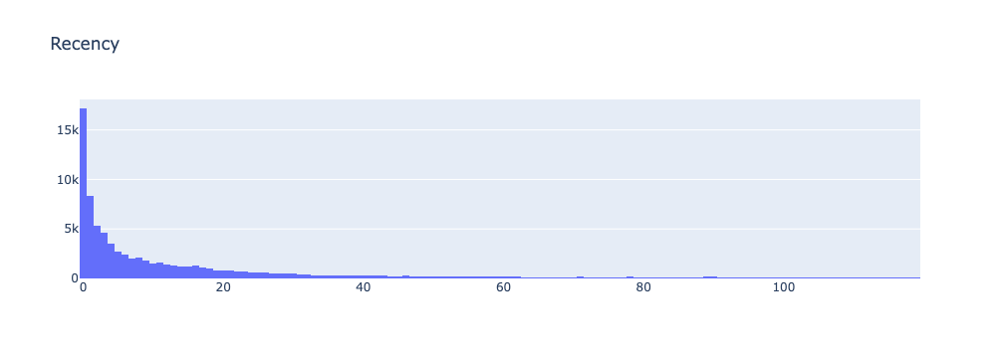

In [42]:
plot_data = [
    go.Histogram(
        #x=trans_user['Recency_scaled']
        x=trans_user.query('Recency < 120')['Recency']
    )
]

plot_layout = go.Layout(
        title='Recency'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

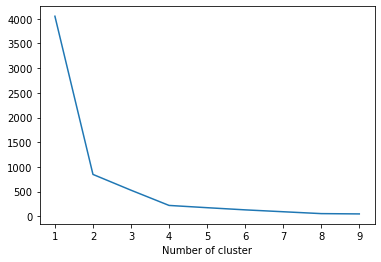

In [43]:
#We used scaled recency column for clustering

sse={}
trans_recency = trans_user[['Recency_scaled']]
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(trans_recency)
    trans_recency["clusters"] = kmeans.labels_
    sse[k] = kmeans.inertia_ 
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.show()

In [44]:
#we determine the number of cluster is 4.
kmeans = KMeans(n_clusters=4)
kmeans.fit(trans_user[['Recency_scaled']])
trans_user['RecencyCluster'] = kmeans.predict(trans_user[['Recency_scaled']])

#we fit and predict together in textbook notebbook
#y_pred = kmeans.fit_predict(X)

In [45]:
#Orders data frame by cluster.

def order_cluster(cluster_field_name, target_field_name,df,ascending):
    new_cluster_field_name = 'new_' + cluster_field_name
    df_new = df.groupby(cluster_field_name)[target_field_name].mean().reset_index()
    df_new = df_new.sort_values(by=target_field_name,ascending=ascending).reset_index(drop=True)
    df_new['index'] = df_new.index
    df_final = pd.merge(df,df_new[[cluster_field_name,'index']], on=cluster_field_name)
    df_final = df_final.drop([cluster_field_name],axis=1)
    df_final = df_final.rename(columns={"index":cluster_field_name})
    return df_final

In [46]:
trans_user = order_cluster('RecencyCluster', 'Recency',trans_user,False)

In [47]:
trans_user.groupby('RecencyCluster')['Recency'].describe()

,count,mean,std,min,25%,50%,75%,max
RecencyCluster,,,,,,,,
0,5038.0,147.923184,19.382769,117.0,131.0,147.0,164.0,183.0
1,6981.0,85.645610,16.379670,60.0,71.0,85.0,99.0,116.0
2,14162.0,33.837664,11.144377,20.0,24.0,31.0,42.0,59.0
3,62363.0,4.752353,5.366410,0.0,0.0,3.0,8.0,19.0


<AxesSubplot:xlabel='RecencyCluster', ylabel='Recency'>

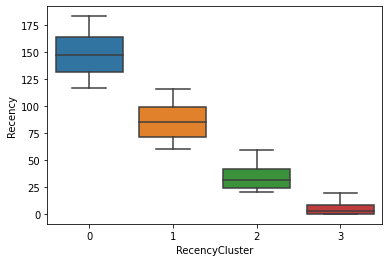

In [48]:
import seaborn as sns
sns.boxplot(x='RecencyCluster', y='Recency', data= trans_user)

# 3.2 Frequency

In [49]:
#Creating data frame "trans_frequency" with columns Customer ID and the counts of transactions
trans_frequency = trans_6m.groupby('MUSTERI_ID_MASK').Date.count().reset_index()

In [50]:
#Renaming the columns 
trans_frequency.columns = ['MUSTERI_ID_MASK','Frequency']

In [51]:
trans_frequency.head()

,MUSTERI_ID_MASK,Frequency
0,1566513,87
1,1567711,147
2,1569761,8
3,1569938,6
4,1572737,452


In [52]:
#Merging the frequency to the trans_user data frame
trans_user = pd.merge(trans_user, trans_frequency, on='MUSTERI_ID_MASK')

In [53]:
trans_user.head()

,MUSTERI_ID_MASK,NextPurchaseDay,Recency,Recency_scaled,RecencyCluster,Frequency
0,11861396,168.0,3,0.016393,3,61
1,11024865,1.0,0,0.000000,3,304
2,10922788,1.0,0,0.000000,3,186
3,3859074,1.0,0,0.000000,3,78
4,11099890,11.0,1,0.005464,3,111


In [54]:
# Scale the frequency column
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
trans_user[["Frequency_scaled"]] = scaler.fit_transform(trans_user[["Frequency"]])

#[["Frequency_scaled"]]= new col name
#["Frequency"] = col you want to scale

In [55]:
trans_user.head()

,MUSTERI_ID_MASK,NextPurchaseDay,Recency,Recency_scaled,RecencyCluster,Frequency,Frequency_scaled
0,11861396,168.0,3,0.016393,3,61,0.021231
1,11024865,1.0,0,0.000000,3,304,0.107219
2,10922788,1.0,0,0.000000,3,186,0.065464
3,3859074,1.0,0,0.000000,3,78,0.027247
4,11099890,11.0,1,0.005464,3,111,0.038924


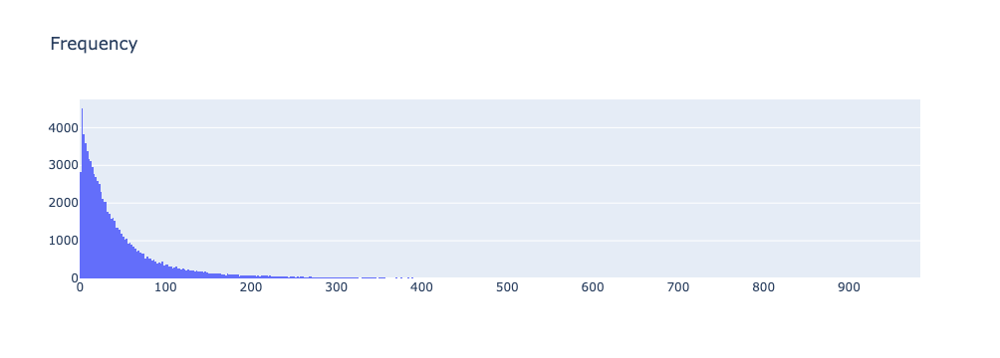

In [56]:
plot_data = [
    go.Histogram(
        x=trans_user.query('Frequency < 1000')['Frequency']
    )
]

plot_layout = go.Layout(
        title='Frequency'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

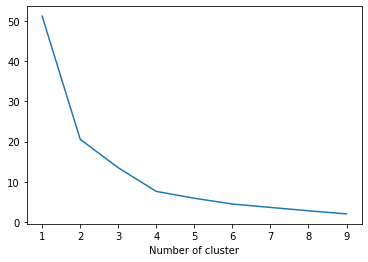

In [57]:
#We used scaled frequency column for clustering
sse={}
trans_frequency = trans_user[['Frequency_scaled']]
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(trans_frequency)
    trans_frequency["clusters"] = kmeans.labels_
    sse[k] = kmeans.inertia_ 
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.show()

In [58]:
#we determine the number of cluster is 4.
kmeans = KMeans(n_clusters=4)
kmeans.fit(trans_user[['Frequency_scaled']])
trans_user['FrequencyCluster'] = kmeans.predict(trans_user[['Frequency_scaled']])

In [59]:
trans_user.head()

,MUSTERI_ID_MASK,NextPurchaseDay,Recency,Recency_scaled,RecencyCluster,Frequency,Frequency_scaled,FrequencyCluster
0,11861396,168.0,3,0.016393,3,61,0.021231,1
1,11024865,1.0,0,0.000000,3,304,0.107219,3
2,10922788,1.0,0,0.000000,3,186,0.065464,3
3,3859074,1.0,0,0.000000,3,78,0.027247,1
4,11099890,11.0,1,0.005464,3,111,0.038924,1


In [60]:
trans_user.groupby('FrequencyCluster')['Frequency'].describe()

,count,mean,std,min,25%,50%,75%,max
FrequencyCluster,,,,,,,,
0,60231.0,19.808604,13.898586,1.0,8.0,18.0,30.0,50.0
1,21061.0,81.033854,23.337780,51.0,61.0,76.0,98.0,136.0
2,1091.0,419.185151,149.985922,306.0,337.0,377.0,448.0,2827.0
3,6161.0,192.722123,44.271209,137.0,155.0,182.0,222.0,305.0


In [61]:
trans_user = order_cluster('FrequencyCluster', 'Frequency',trans_user,True)

In [62]:
trans_user.head()

,MUSTERI_ID_MASK,NextPurchaseDay,Recency,Recency_scaled,RecencyCluster,Frequency,Frequency_scaled,FrequencyCluster
0,11861396,168.0,3,0.016393,3,61,0.021231,1
1,3859074,1.0,0,0.000000,3,78,0.027247,1
2,11099890,11.0,1,0.005464,3,111,0.038924,1
3,20674498,21.0,5,0.027322,3,81,0.028309,1
4,5797036,17.0,0,0.000000,3,51,0.017693,1


<AxesSubplot:xlabel='FrequencyCluster', ylabel='Frequency'>

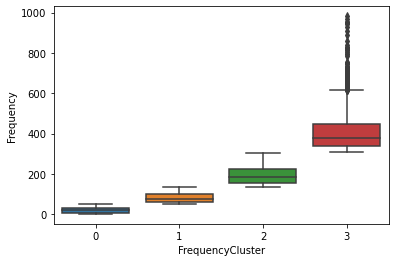

In [63]:
sns.boxplot(x='FrequencyCluster', y=trans_user.query('Frequency < 1000')['Frequency'], data= trans_user)

## 3.3 Monetary

In [64]:
#Creating data frame "trans_monetary" with columns Customer ID and the sum of transactions
trans_monetary = trans_6m.groupby('MUSTERI_ID_MASK').ISLEM_TUTARI.sum().reset_index()

In [65]:
#Renaming the columns
trans_monetary.columns = ['MUSTERI_ID_MASK','Monetary']

In [66]:
trans_monetary.head()

,MUSTERI_ID_MASK,Monetary
0,1566513,8521.17
1,1567711,9336.41
2,1569761,11259.99
3,1569938,2105.00
4,1572737,30148.79


In [67]:
#Merging monetary with trans_user
trans_user = pd.merge(trans_user, trans_monetary, on='MUSTERI_ID_MASK')

In [68]:
trans_user.head()

,MUSTERI_ID_MASK,NextPurchaseDay,Recency,Recency_scaled,RecencyCluster,Frequency,Frequency_scaled,FrequencyCluster,Monetary
0,11861396,168.0,3,0.016393,3,61,0.021231,1,3211.81
1,3859074,1.0,0,0.000000,3,78,0.027247,1,12708.27
2,11099890,11.0,1,0.005464,3,111,0.038924,1,3042.17
3,20674498,21.0,5,0.027322,3,81,0.028309,1,5937.02
4,5797036,17.0,0,0.000000,3,51,0.017693,1,6336.99


In [69]:
# Scale the monetary column
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
trans_user[["Monetary_scaled"]] = scaler.fit_transform(trans_user[["Monetary"]])

#[["Monetary_scaled"]]= new col name
#["Monetary"] = col you want to scale

In [70]:
trans_user.head()

,MUSTERI_ID_MASK,NextPurchaseDay,Recency,Recency_scaled,RecencyCluster,Frequency,Frequency_scaled,FrequencyCluster,Monetary,Monetary_scaled
0,11861396,168.0,3,0.016393,3,61,0.021231,1,3211.81,0.003102
1,3859074,1.0,0,0.000000,3,78,0.027247,1,12708.27,0.012275
2,11099890,11.0,1,0.005464,3,111,0.038924,1,3042.17,0.002938
3,20674498,21.0,5,0.027322,3,81,0.028309,1,5937.02,0.005735
4,5797036,17.0,0,0.000000,3,51,0.017693,1,6336.99,0.006121


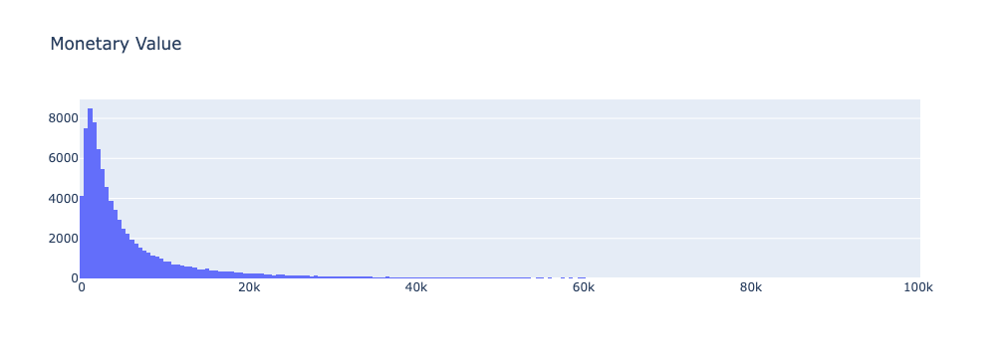

In [71]:
plot_data = [
    go.Histogram(
        x=trans_user.query('Monetary < 100000')['Monetary']
        #x=trans_user["Monetary_scaled"]
    )
]

plot_layout = go.Layout(
        title='Monetary Value'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

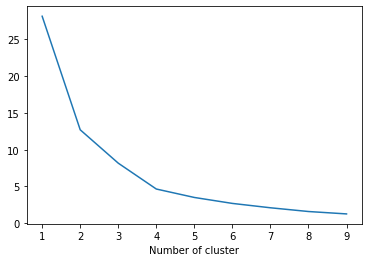

In [72]:
#We used scaled monetary column for clustering
sse={}
trans_monetary = trans_user[['Monetary_scaled']]
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(trans_monetary)
    trans_monetary["clusters"] = kmeans.labels_
    sse[k] = kmeans.inertia_ 
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.show()

In [73]:
#we determine the number of cluster is 4.
kmeans = KMeans(n_clusters=4)
kmeans.fit(trans_user[['Monetary']])
trans_user['MonetaryCluster'] = kmeans.predict(trans_user[['Monetary']])

In [74]:
trans_user.head()

,MUSTERI_ID_MASK,NextPurchaseDay,Recency,Recency_scaled,RecencyCluster,Frequency,Frequency_scaled,FrequencyCluster,Monetary,Monetary_scaled,MonetaryCluster
0,11861396,168.0,3,0.016393,3,61,0.021231,1,3211.81,0.003102,0
1,3859074,1.0,0,0.000000,3,78,0.027247,1,12708.27,0.012275,0
2,11099890,11.0,1,0.005464,3,111,0.038924,1,3042.17,0.002938,0
3,20674498,21.0,5,0.027322,3,81,0.028309,1,5937.02,0.005735,0
4,5797036,17.0,0,0.000000,3,51,0.017693,1,6336.99,0.006121,0


In [75]:
trans_user = order_cluster('MonetaryCluster', 'Monetary',trans_user,True)

In [76]:
trans_user.groupby('MonetaryCluster')['Monetary'].describe()

,count,mean,std,min,25%,50%,75%,max
MonetaryCluster,,,,,,,,
0,77548.0,3851.281744,3545.202174,0.01,1204.9975,2640.000,5452.6750,15458.13
1,9074.0,27121.467985,10126.573798,15458.65,18789.6375,24102.240,33154.0675,54600.41
2,1686.0,82174.165819,24206.694100,54631.26,62865.2750,75192.725,95015.7725,154373.23
3,236.0,226627.863178,93577.248221,155255.90,171989.7675,203839.725,240463.0200,1035294.98


<AxesSubplot:xlabel='MonetaryCluster', ylabel='Monetary'>

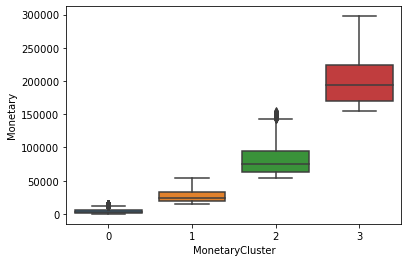

In [77]:
sns.boxplot(x='MonetaryCluster', y=trans_user.query('Monetary < 300000')['Monetary'], data= trans_user)

# 4. Customer Segmentation

In [78]:
trans_user.head()

,MUSTERI_ID_MASK,NextPurchaseDay,Recency,Recency_scaled,RecencyCluster,Frequency,Frequency_scaled,FrequencyCluster,Monetary,Monetary_scaled,MonetaryCluster
0,11861396,168.0,3,0.016393,3,61,0.021231,1,3211.81,0.003102,0
1,3859074,1.0,0,0.000000,3,78,0.027247,1,12708.27,0.012275,0
2,11099890,11.0,1,0.005464,3,111,0.038924,1,3042.17,0.002938,0
3,20674498,21.0,5,0.027322,3,81,0.028309,1,5937.02,0.005735,0
4,5797036,17.0,0,0.000000,3,51,0.017693,1,6336.99,0.006121,0


In [79]:
#Overall score is the some of each score comes from the metrics.
trans_user['OverallScore'] = trans_user['RecencyCluster'] + trans_user['FrequencyCluster'] + trans_user['MonetaryCluster']

In [80]:
trans_user.groupby('OverallScore')['Recency','Frequency','Monetary'].mean()

,Recency,Frequency,Monetary
OverallScore,,,
0,148.237147,8.052632,1136.644721
1,86.750963,13.914162,2204.184461
2,36.423765,18.540312,3059.432906
3,7.551979,25.200155,3695.848470
4,4.477590,74.638134,9157.635847
5,2.975364,129.353703,21604.129883
6,1.833848,191.092341,37648.486519
7,1.146620,298.008780,64563.564917
8,0.715385,428.300000,106168.514103


In [81]:
trans_user.groupby('OverallScore')['Recency'].count()

OverallScore
0     4921
1     6489
2    12304
3    36197
4    17559
5     6251
6     3238
7     1139
8      390
9       56
Name: Recency, dtype: int64

In [82]:
trans_user['Segment'] = 'Low-Value'
trans_user.loc[trans_user['OverallScore']>2,'Segment'] = 'Mid-Value' 
trans_user.loc[trans_user['OverallScore']>5,'Segment'] = 'High-Value' 


In [83]:
#df_sp = trans_user[trans_user['Frequency'] < 500 ] 

In [84]:
#df_sp = df_sp[df_sp['Monetary'] < 100000]

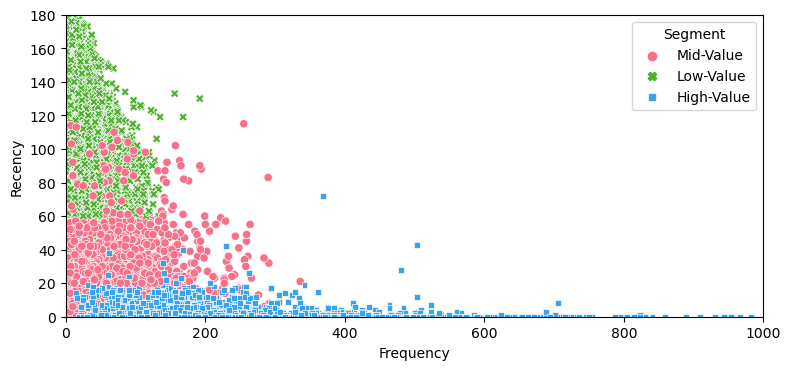

In [85]:
#Recency ~ Frequency
plt.figure(dpi=100,figsize=(9,4))
sns.scatterplot(x='Frequency' , y='Recency', data=trans_user, hue='Segment',style="Segment", palette="husl")
plt.ylim(0, 180)
plt.xlim(0, 1000)
 
plt.show()

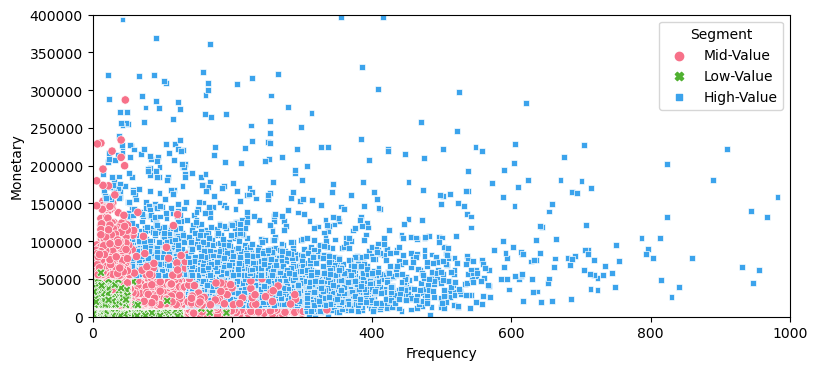

In [86]:
#Monetary ~ Frequency
plt.figure(dpi=100,figsize=(9,4))
sns.scatterplot(x='Frequency' , y='Monetary', data=trans_user,hue='Segment', style="Segment",palette="husl")
plt.ylim(0, 400000)
plt.xlim(0, 1000)
plt.show()

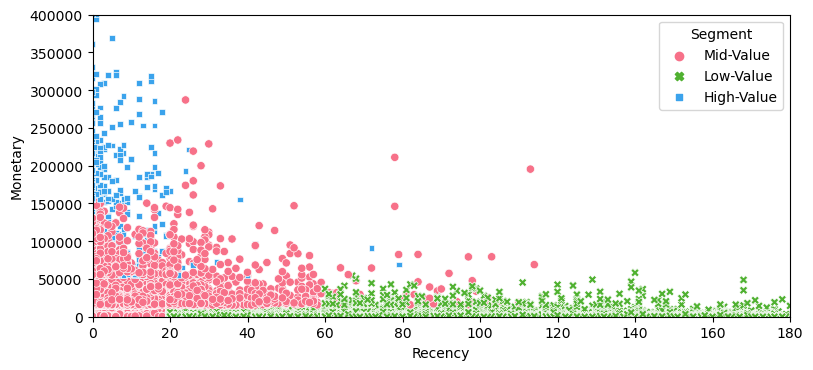

In [87]:
#Monetary ~ Recency
plt.figure(dpi=100,figsize=(9,4))
sns.scatterplot(x='Recency' , y='Monetary', data=trans_user,hue='Segment', style="Segment", palette="husl")
plt.ylim(0, 400000)
plt.xlim(0, 180)
plt.show()

## NOT WORK : Clustering all metrics once

As discussed, I clustered all metrics once...

In [88]:
rfm_scaled = trans_user[["Recency", "Frequency", "Monetary"]]
rfm_scaled

,Recency,Frequency,Monetary
0,3,61,3211.81
1,0,78,12708.27
2,1,111,3042.17
3,5,81,5937.02
4,0,51,6336.99
...,...,...,...
88539,28,46,200007.50
88540,30,7,228903.00
88541,26,6,180000.00
88542,78,41,211102.52


In [89]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [90]:
rfm_scaled = scaler.fit_transform(rfm_scaled)
rfm_scaled = pd.DataFrame(rfm_scaled)
rfm_scaled.head()

,0,1,2
0,-0.534612,0.142380,-0.276887
1,-0.611246,0.392533,0.237746
2,-0.585701,0.878124,-0.286080
3,-0.483522,0.436678,-0.129202
4,-0.611246,-0.004769,-0.107527


In [91]:
# Renaming the columns
rfm_scaled.columns = ['Recency', 'Frequency','Monetary']

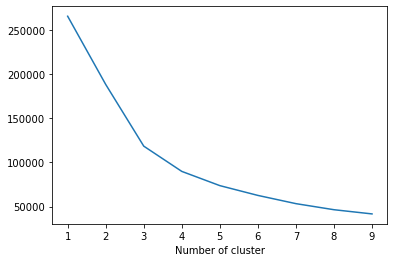

In [92]:
sse={}

for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(rfm_scaled)
    sse[k] = kmeans.inertia_ 
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.show()

In [93]:
cluster_labels = kmeans.labels_
cluster_labels

array([1, 1, 1, ..., 2, 6, 6], dtype=int32)

In [94]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(rfm_scaled)

KMeans(n_clusters=4)

In [95]:
rfm_scaled.loc[:, "Customer_ID"] = trans_user["MUSTERI_ID_MASK"]

In [96]:
rfm_scaled["cluster"] = kmeans.labels_

In [97]:
rfm_scaled.head()

,Recency,Frequency,Monetary,Customer_ID,cluster
0,-0.534612,0.142380,-0.276887,11861396,0
1,-0.611246,0.392533,0.237746,3859074,0
2,-0.585701,0.878124,-0.286080,11099890,0
3,-0.483522,0.436678,-0.129202,20674498,0
4,-0.611246,-0.004769,-0.107527,5797036,0


In [98]:
rfm_scaled.columns = ['Recency', 'Frequency','Monetary', 'Customer_ID', 'cluster']

In [99]:
rfm_scaled.head()

,Recency,Frequency,Monetary,Customer_ID,cluster
0,-0.534612,0.142380,-0.276887,11861396,0
1,-0.611246,0.392533,0.237746,3859074,0
2,-0.585701,0.878124,-0.286080,11099890,0
3,-0.483522,0.436678,-0.129202,20674498,0
4,-0.611246,-0.004769,-0.107527,5797036,0


In [100]:
rfm_scaled.loc[:, "Recency_r"] = trans_user["Recency"]
rfm_scaled.loc[:, "Frequency_r"] = trans_user["Frequency"]
rfm_scaled.loc[:, "Monetary_r"] = trans_user["Monetary"]

In [101]:
rfm_scaled.head()

,Recency,Frequency,Monetary,Customer_ID,cluster,Recency_r,Frequency_r,Monetary_r
0,-0.534612,0.142380,-0.276887,11861396,0,3,61,3211.81
1,-0.611246,0.392533,0.237746,3859074,0,0,78,12708.27
2,-0.585701,0.878124,-0.286080,11099890,0,1,111,3042.17
3,-0.483522,0.436678,-0.129202,20674498,0,5,81,5937.02
4,-0.611246,-0.004769,-0.107527,5797036,0,0,51,6336.99


<AxesSubplot:xlabel='cluster', ylabel='Recency_r'>

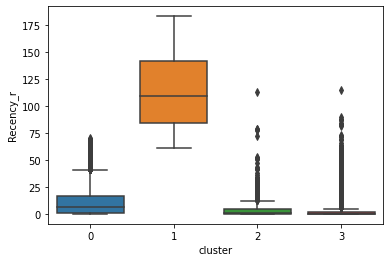

In [102]:
import seaborn as sns
sns.boxplot(x='cluster', y='Recency_r', data= rfm_scaled)

<AxesSubplot:xlabel='cluster', ylabel='Frequency_r'>

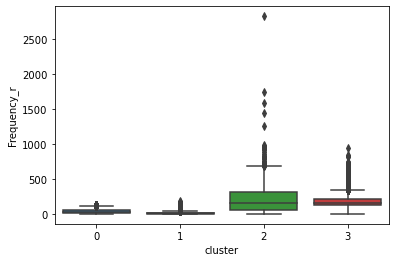

In [103]:
sns.boxplot(x='cluster', y='Frequency_r', data= rfm_scaled)

<AxesSubplot:xlabel='cluster', ylabel='Monetary_r'>

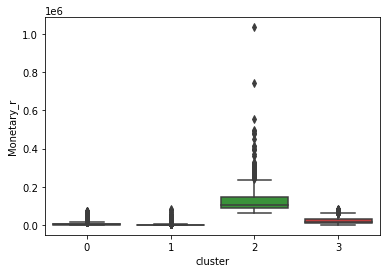

In [104]:
sns.boxplot(x='cluster', y='Monetary_r', data= rfm_scaled)

I could not make it work.

# 3D-plot

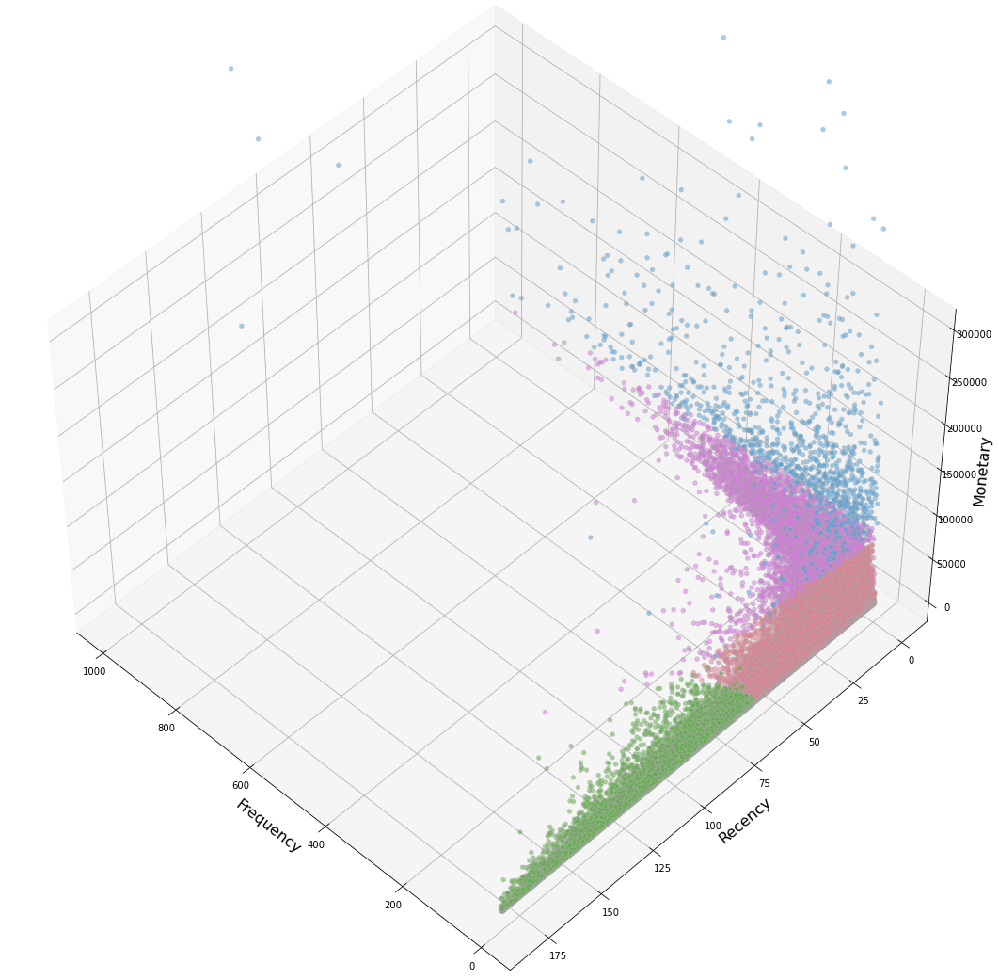

In [105]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap

plt.rcParams["figure.figsize"] = (15,15)
fig = plt.figure(1)
plt.clf()

ax = Axes3D(fig,
            rect=[0, 0, 0.95, 1],
            elev= 48,
            azim=134)
plt.cla()
ax.scatter(rfm_scaled['Frequency_r'], rfm_scaled['Recency_r'], rfm_scaled['Monetary_r'],
           c= rfm_scaled['cluster'],
           cmap = ListedColormap(sns.color_palette("husl").as_hex()),
           alpha=0.5,
           edgecolor='darkgrey',
          label=rfm_scaled['cluster'])

ax.set_xlabel('Frequency', fontsize = 16)
ax.set_ylabel('Recency', fontsize = 16)  
ax.set_zlabel('Monetary', fontsize = 16)

ax.auto_scale_xyz([0, 1000], [0, 180], [0, 300000])


plt.show()
            

# 5. Additional Features for Predicting Next Transaction Date

In [106]:
#create a dataframe with CustomerID and Transaction Date
trans_day_order = trans_6m[['MUSTERI_ID_MASK','Date']]

In [107]:
trans_day_order.head()

,MUSTERI_ID_MASK,Date
0,11861396,2014-10-23
1,11024865,2014-07-23
2,10922788,2014-08-06
3,3859074,2014-08-13
4,11099890,2014-08-13


In [108]:
#Convert Invoice Datetime to day
trans_day_order['Day'] = trans_6m['Date'].dt.date

In [109]:
trans_day_order.head()

,MUSTERI_ID_MASK,Date,Day
0,11861396,2014-10-23,2014-10-23
1,11024865,2014-07-23,2014-07-23
2,10922788,2014-08-06,2014-08-06
3,3859074,2014-08-13,2014-08-13
4,11099890,2014-08-13,2014-08-13


In [110]:
trans_day_order = trans_day_order.sort_values(['MUSTERI_ID_MASK','Date'])

In [111]:
#Drop duplicates
trans_day_order = trans_day_order.drop_duplicates(subset=['MUSTERI_ID_MASK','Day'],keep='first')

In [112]:
trans_day_order.head(10)

,MUSTERI_ID_MASK,Date,Day
1226765,1566513,2014-07-01,2014-07-01
3349320,1566513,2014-07-02,2014-07-02
1006557,1566513,2014-07-03,2014-07-03
637252,1566513,2014-07-05,2014-07-05
3037908,1566513,2014-07-06,2014-07-06
1171668,1566513,2014-07-07,2014-07-07
3037844,1566513,2014-07-08,2014-07-08
3329289,1566513,2014-07-09,2014-07-09
4056569,1566513,2014-07-10,2014-07-10
1817423,1566513,2014-07-13,2014-07-13


In [113]:
#shifting last 3 purchase dates
trans_day_order['PrevDate'] = trans_day_order.groupby('MUSTERI_ID_MASK')['Day'].shift(1)
trans_day_order['T2Date'] = trans_day_order.groupby('MUSTERI_ID_MASK')['Day'].shift(2)
trans_day_order['T3Date'] = trans_day_order.groupby('MUSTERI_ID_MASK')['Day'].shift(3)

In [114]:
trans_day_order.head(10)

,MUSTERI_ID_MASK,Date,Day,PrevDate,T2Date,T3Date
1226765,1566513,2014-07-01,2014-07-01,NaN,NaN,NaN
3349320,1566513,2014-07-02,2014-07-02,2014-07-01,NaN,NaN
1006557,1566513,2014-07-03,2014-07-03,2014-07-02,2014-07-01,NaN
637252,1566513,2014-07-05,2014-07-05,2014-07-03,2014-07-02,2014-07-01
3037908,1566513,2014-07-06,2014-07-06,2014-07-05,2014-07-03,2014-07-02
1171668,1566513,2014-07-07,2014-07-07,2014-07-06,2014-07-05,2014-07-03
3037844,1566513,2014-07-08,2014-07-08,2014-07-07,2014-07-06,2014-07-05
3329289,1566513,2014-07-09,2014-07-09,2014-07-08,2014-07-07,2014-07-06
4056569,1566513,2014-07-10,2014-07-10,2014-07-09,2014-07-08,2014-07-07
1817423,1566513,2014-07-13,2014-07-13,2014-07-10,2014-07-09,2014-07-08


In [115]:
trans_day_order['DayDiff'] = (trans_day_order['Day'] - trans_day_order['PrevDate']).dt.days
trans_day_order['DayDiff2'] = (trans_day_order['Day'] - trans_day_order['T2Date']).dt.days
trans_day_order['DayDiff3'] = (trans_day_order['Day'] - trans_day_order['T3Date']).dt.days

In [116]:
trans_day_order.head(10)

,MUSTERI_ID_MASK,Date,Day,PrevDate,T2Date,T3Date,DayDiff,DayDiff2,DayDiff3
1226765,1566513,2014-07-01,2014-07-01,NaN,NaN,NaN,NaN,NaN,NaN
3349320,1566513,2014-07-02,2014-07-02,2014-07-01,NaN,NaN,1.0,NaN,NaN
1006557,1566513,2014-07-03,2014-07-03,2014-07-02,2014-07-01,NaN,1.0,2.0,NaN
637252,1566513,2014-07-05,2014-07-05,2014-07-03,2014-07-02,2014-07-01,2.0,3.0,4.0
3037908,1566513,2014-07-06,2014-07-06,2014-07-05,2014-07-03,2014-07-02,1.0,3.0,4.0
1171668,1566513,2014-07-07,2014-07-07,2014-07-06,2014-07-05,2014-07-03,1.0,2.0,4.0
3037844,1566513,2014-07-08,2014-07-08,2014-07-07,2014-07-06,2014-07-05,1.0,2.0,3.0
3329289,1566513,2014-07-09,2014-07-09,2014-07-08,2014-07-07,2014-07-06,1.0,2.0,3.0
4056569,1566513,2014-07-10,2014-07-10,2014-07-09,2014-07-08,2014-07-07,1.0,2.0,3.0
1817423,1566513,2014-07-13,2014-07-13,2014-07-10,2014-07-09,2014-07-08,3.0,4.0,5.0


In [117]:
trans_day_diff = trans_day_order.groupby('MUSTERI_ID_MASK').agg({'DayDiff': ['mean','std']}).reset_index()

In [118]:
trans_day_diff.columns = ['MUSTERI_ID_MASK', 'DayDiffMean','DayDiffStd']

In [119]:
trans_day_diff.head()

,MUSTERI_ID_MASK,DayDiffMean,DayDiffStd
0,1566513,1.878049,2.075995
1,1567711,1.988889,1.764153
2,1569761,36.000000,40.521599
3,1569938,37.250000,35.245567
4,1572737,1.158228,0.430111


In [120]:
trans_day_order_last = trans_day_order.drop_duplicates(subset=['MUSTERI_ID_MASK'],keep='last')

In [121]:
trans_day_order_last.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 88544 entries, 638612 to 567253
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   MUSTERI_ID_MASK  88544 non-null  int64         
 1   Date             88544 non-null  datetime64[ns]
 2   Day              88544 non-null  object        
 3   PrevDate         84965 non-null  object        
 4   T2Date           81905 non-null  object        
 5   T3Date           79197 non-null  object        
 6   DayDiff          84965 non-null  float64       
 7   DayDiff2         81905 non-null  float64       
 8   DayDiff3         79197 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int64(1), object(4)
memory usage: 6.8+ MB


In [122]:
trans_day_order_last = trans_day_order_last.dropna()

In [123]:
trans_day_order_last.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79197 entries, 638612 to 2400154
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   MUSTERI_ID_MASK  79197 non-null  int64         
 1   Date             79197 non-null  datetime64[ns]
 2   Day              79197 non-null  object        
 3   PrevDate         79197 non-null  object        
 4   T2Date           79197 non-null  object        
 5   T3Date           79197 non-null  object        
 6   DayDiff          79197 non-null  float64       
 7   DayDiff2         79197 non-null  float64       
 8   DayDiff3         79197 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int64(1), object(4)
memory usage: 6.0+ MB


In [124]:
trans_day_order_last = pd.merge(trans_day_order_last, trans_day_diff, on='MUSTERI_ID_MASK')


In [125]:
trans_day_order_last.head()

,MUSTERI_ID_MASK,Date,Day,PrevDate,T2Date,T3Date,DayDiff,DayDiff2,DayDiff3,DayDiffMean,DayDiffStd
0,1566513,2014-09-16,2014-09-16,2014-09-15,2014-09-14,2014-09-13,1.0,2.0,3.0,1.878049,2.075995
1,1567711,2014-12-28,2014-12-28,2014-12-22,2014-12-19,2014-12-18,6.0,9.0,10.0,1.988889,1.764153
2,1569761,2014-12-31,2014-12-31,2014-11-28,2014-08-26,2014-08-22,33.0,127.0,131.0,36.000000,40.521599
3,1569938,2014-12-27,2014-12-27,2014-12-21,2014-12-03,2014-10-25,6.0,24.0,63.0,37.250000,35.245567
4,1572737,2014-12-31,2014-12-31,2014-12-30,2014-12-29,2014-12-28,1.0,2.0,3.0,1.158228,0.430111


In [126]:
trans_user = pd.merge(trans_user, trans_day_order_last[['MUSTERI_ID_MASK',
                                                        'DayDiff',
                                                        'DayDiff2',
                                                        'DayDiff3',
                                                        'DayDiffMean',
                                                        'DayDiffStd']], 
                      on='MUSTERI_ID_MASK')

In [127]:
trans_user.head()

,MUSTERI_ID_MASK,NextPurchaseDay,Recency,Recency_scaled,RecencyCluster,Frequency,Frequency_scaled,FrequencyCluster,Monetary,Monetary_scaled,MonetaryCluster,OverallScore,Segment,DayDiff,DayDiff2,DayDiff3,DayDiffMean,DayDiffStd
0,11861396,168.0,3,0.016393,3,61,0.021231,1,3211.81,0.003102,0,4,Mid-Value,1.0,2.0,3.0,2.617647,3.084808
1,3859074,1.0,0,0.000000,3,78,0.027247,1,12708.27,0.012275,0,4,Mid-Value,1.0,2.0,3.0,5.352941,8.142229
2,11099890,11.0,1,0.005464,3,111,0.038924,1,3042.17,0.002938,0,4,Mid-Value,1.0,5.0,8.0,2.686567,2.499751
3,20674498,21.0,5,0.027322,3,81,0.028309,1,5937.02,0.005735,0,4,Mid-Value,1.0,3.0,6.0,3.933333,8.611303
4,5797036,17.0,0,0.000000,3,51,0.017693,1,6336.99,0.006121,0,4,Mid-Value,1.0,5.0,8.0,5.851852,7.896950


In [128]:
trans_user.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79197 entries, 0 to 79196
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   MUSTERI_ID_MASK   79197 non-null  int64  
 1   NextPurchaseDay   79197 non-null  float64
 2   Recency           79197 non-null  int64  
 3   Recency_scaled    79197 non-null  float64
 4   RecencyCluster    79197 non-null  int64  
 5   Frequency         79197 non-null  int64  
 6   Frequency_scaled  79197 non-null  float64
 7   FrequencyCluster  79197 non-null  int64  
 8   Monetary          79197 non-null  float64
 9   Monetary_scaled   79197 non-null  float64
 10  MonetaryCluster   79197 non-null  int64  
 11  OverallScore      79197 non-null  int64  
 12  Segment           79197 non-null  object 
 13  DayDiff           79197 non-null  float64
 14  DayDiff2          79197 non-null  float64
 15  DayDiff3          79197 non-null  float64
 16  DayDiffMean       79197 non-null  float6

In [129]:
#Saving the data as csv 

trans_user.to_csv(r"~/Downloads/ML_project/data/final_data.csv", index=False)